In [15]:
%matplotlib inline
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import os

# File paths (change agar zaroorat ho)
INPUT_WAV = "male.wav"                 # original
RECON_WAV = "output_from_scale.wav"     # reconstructed (model output saved earlier)

# STFT / mel params (match your HiFi-GAN config)
SR = 22050
N_FFT = 1024
HOP_LENGTH = 256
WIN_LENGTH = 1024
N_MELS = 80

# safety epsilon
_eps = 1e-9

print("Files (original, reconstructed):", INPUT_WAV, "|", RECON_WAV)


Files (original, reconstructed): male.wav | output_from_scale.wav


In [16]:
def compute_snr(ref, est, eps=_eps):
    min_len = min(len(ref), len(est))
    ref = ref[:min_len]
    est = est[:min_len]
    signal_power = np.sum(ref**2)
    noise_power = np.sum((ref - est)**2) + eps
    return 10.0 * np.log10(signal_power / noise_power)

def spectral_convergence(ref, est, n_fft=N_FFT, hop_length=HOP_LENGTH, eps=_eps):
    S_ref = np.abs(librosa.stft(ref, n_fft=n_fft, hop_length=hop_length))
    S_est = np.abs(librosa.stft(est, n_fft=n_fft, hop_length=hop_length))
    num = np.linalg.norm(S_ref - S_est, ord='fro')
    den = np.linalg.norm(S_ref, ord='fro') + eps
    return float(num / den)

def lsd_per_frame(ref, est, n_fft=N_FFT, hop_length=HOP_LENGTH, eps=_eps):
    S_ref = np.abs(librosa.stft(ref, n_fft=n_fft, hop_length=hop_length))
    S_est = np.abs(librosa.stft(est, n_fft=n_fft, hop_length=hop_length))
    S_ref = np.maximum(S_ref, eps)
    S_est = np.maximum(S_est, eps)
    log_ref = 20.0 * np.log10(S_ref)
    log_est = 20.0 * np.log10(S_est)
    lsd_frames = np.sqrt(np.mean((log_ref - log_est)**2, axis=0))  # per-frame LSD (dB)
    return lsd_frames, float(np.mean(lsd_frames))


In [17]:
# Load original
orig, sr1 = librosa.load(INPUT_WAV, sr=SR)
# Load reconstructed
if not os.path.exists(RECON_WAV):
    raise FileNotFoundError("Reconstructed file not found: " + RECON_WAV)
recon, sr2 = librosa.load(RECON_WAV, sr=SR)

print("Loaded. SRs:", sr1, sr2, "| lengths (s):", len(orig)/SR, len(recon)/SR)
# Align lengths to minimum for fair comparison
min_len = min(len(orig), len(recon))
orig_a = orig[:min_len]
recon_a = recon[:min_len]


Loaded. SRs: 22050 22050 | lengths (s): 73.65065759637189 7.9412244897959186


/home/hemant/miniconda3/envs/hifi-gan/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  if __name__ == '__main__':
/home/hemant/miniconda3/envs/hifi-gan/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


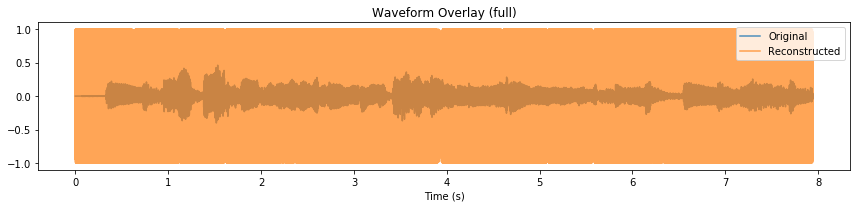

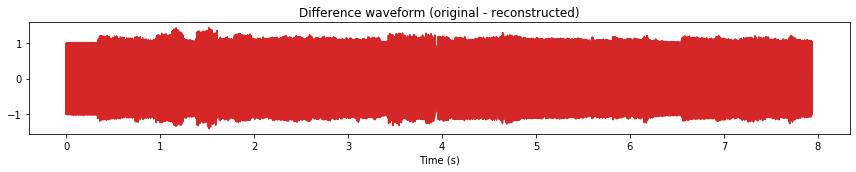

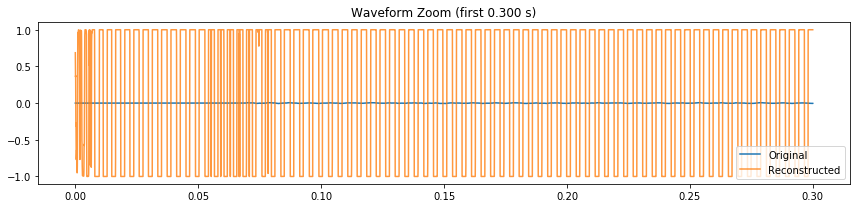

In [18]:
t = np.arange(min_len) / SR

plt.figure(figsize=(12,3))
plt.plot(t, orig_a, label='Original', alpha=0.8)
plt.plot(t, recon_a, label='Reconstructed', alpha=0.7)
plt.title("Waveform Overlay (full)")
plt.xlabel("Time (s)")
plt.legend()
plt.tight_layout()
plt.show()

# Difference waveform
diff = orig_a - recon_a
plt.figure(figsize=(12,2.5))
plt.plot(t, diff, color='C3')
plt.title("Difference waveform (original - reconstructed)")
plt.xlabel("Time (s)")
plt.tight_layout()
plt.show()

# Zoom into short region (first 0.3s or less)
zoom_dur = min(0.3, min_len / SR)
if zoom_dur > 0.0:
    end_sample = int(zoom_dur * SR)
    tz = np.arange(end_sample) / SR
    plt.figure(figsize=(12,3))
    plt.plot(tz, orig_a[:end_sample], label='Original')
    plt.plot(tz, recon_a[:end_sample], label='Reconstructed', alpha=0.8)
    plt.title(f"Waveform Zoom (first {zoom_dur:.3f} s)")
    plt.legend()
    plt.tight_layout()
    plt.show()


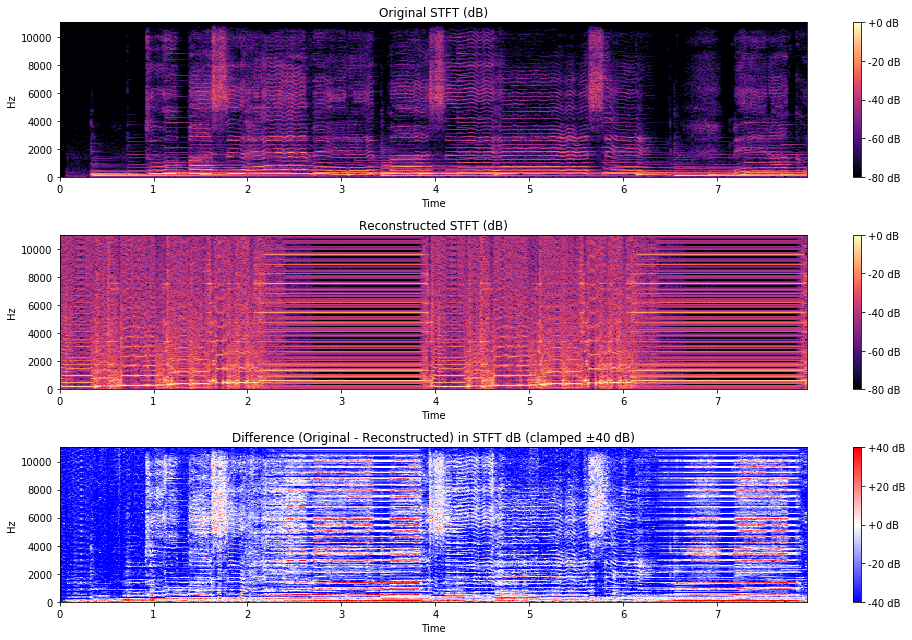

In [19]:
S_ref = np.abs(librosa.stft(orig_a, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH))
S_rec = np.abs(librosa.stft(recon_a, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH))

S_ref_db = librosa.amplitude_to_db(np.maximum(S_ref, _eps), ref=np.max)
S_rec_db = librosa.amplitude_to_db(np.maximum(S_rec, _eps), ref=np.max)

plt.figure(figsize=(14,9))
plt.subplot(3,1,1)
librosa.display.specshow(S_ref_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='hz')
plt.title("Original STFT (dB)")
plt.colorbar(format='%+2.0f dB')

plt.subplot(3,1,2)
librosa.display.specshow(S_rec_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='hz')
plt.title("Reconstructed STFT (dB)")
plt.colorbar(format='%+2.0f dB')

plt.subplot(3,1,3)
# difference in dB (signed)
diff_db = S_ref_db - S_rec_db
librosa.display.specshow(diff_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='hz', cmap='bwr', vmin=-40, vmax=40)
plt.title("Difference (Original - Reconstructed) in STFT dB (clamped ±40 dB)")
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()


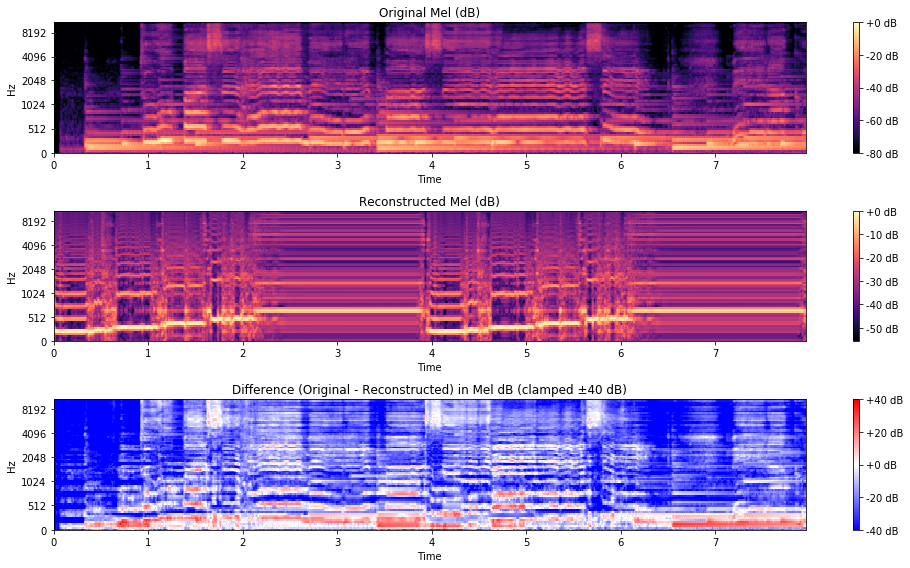

In [20]:
M_ref = librosa.feature.melspectrogram(y=orig_a, sr=SR, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH, n_mels=N_MELS, power=2.0)
M_rec = librosa.feature.melspectrogram(y=recon_a, sr=SR, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH, n_mels=N_MELS, power=2.0)

M_ref_db = librosa.power_to_db(np.maximum(M_ref, _eps), ref=np.max)
M_rec_db = librosa.power_to_db(np.maximum(M_rec, _eps), ref=np.max)

plt.figure(figsize=(14,8))
plt.subplot(3,1,1)
librosa.display.specshow(M_ref_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='mel')
plt.title("Original Mel (dB)")
plt.colorbar(format='%+2.0f dB')

plt.subplot(3,1,2)
librosa.display.specshow(M_rec_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='mel')
plt.title("Reconstructed Mel (dB)")
plt.colorbar(format='%+2.0f dB')

plt.subplot(3,1,3)
diff_mel_db = M_ref_db - M_rec_db
librosa.display.specshow(diff_mel_db, sr=SR, hop_length=HOP_LENGTH, x_axis='time', y_axis='mel', cmap='bwr', vmin=-40, vmax=40)
plt.title("Difference (Original - Reconstructed) in Mel dB (clamped ±40 dB)")
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()


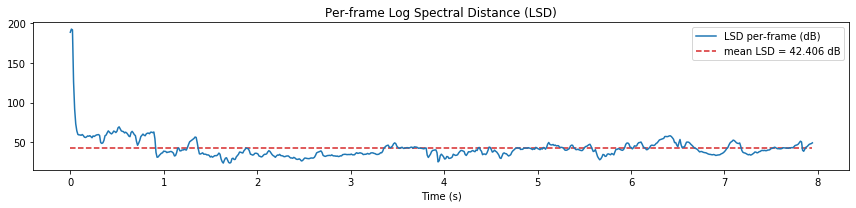

===== Numeric quality metrics =====
SNR (dB)               : -20.496
Mean LSD (dB)          : 42.406
Spectral convergence   : 10.447285


In [21]:
# per-frame LSD and mean
lsd_frames, mean_lsd = lsd_per_frame(orig_a, recon_a, n_fft=N_FFT, hop_length=HOP_LENGTH)
times = librosa.frames_to_time(np.arange(len(lsd_frames)), sr=SR, hop_length=HOP_LENGTH)

plt.figure(figsize=(12,3))
plt.plot(times, lsd_frames, label='LSD per-frame (dB)')
plt.hlines(mean_lsd, times[0], times[-1], colors='C3', linestyles='--', label=f'mean LSD = {mean_lsd:.3f} dB')
plt.xlabel('Time (s)')
plt.title('Per-frame Log Spectral Distance (LSD)')
plt.legend()
plt.tight_layout()
plt.show()

# numeric metrics
snr_val = compute_snr(orig_a, recon_a)
spec_conv = spectral_convergence(orig_a, recon_a, n_fft=N_FFT, hop_length=HOP_LENGTH)

print("===== Numeric quality metrics =====")
print(f"SNR (dB)               : {snr_val:.3f}")
print(f"Mean LSD (dB)          : {mean_lsd:.3f}")
print(f"Spectral convergence   : {spec_conv:.6f}")


In [22]:
print("Original audio:")
display(Audio(INPUT_WAV))

print("Reconstructed audio:")
display(Audio(RECON_WAV))


Original audio:


Reconstructed audio:
